## Stable Diffusion

   Stable Diffusion is a generative artificial intelligence (generative AI) model that produces unique photorealistic images from text and image prompts. It originally launched in 2022. Besides images, you can also use the model to create videos and animations.

In [1]:
!nvidia-smi #to check the GPU capacity of the machine

Wed Feb  5 11:55:21 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

#### Installation
*   [cuda](https://developer.nvidia.com/cuda-toolkit) - a proprietary parallel computing platform and application programming interface (API) that allows software to use certain types of graphics processing units (GPUs) for accelerated general-purpose processing, an approach called general-purpose computing on GPUs.
*   [xformers](https://facebookresearch.github.io/xformers/components/ops.html) - memory optimization since we have limited memory in the VM
*   [diffusers](https://huggingface.co/docs/diffusers/en/index) - go-to library for state-of-the-art pretrained diffusion models for generating images, audio, and even 3D structures of molecules.
*   [torch](https://pytorch.org/) - A Tensor library like NumPy, with strong GPU support


In [2]:
!pip install --upgrade "jax[cuda]" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html
!pip install diffusers flax jaxlib
!pip install --pre -U xformers
!pip install -q accelerate transformers ftfy bitsandbytes gradio natsort safetensors huggingface-hub
!pip install --upgrade torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Looking in links: https://storage.googleapis.com/jax-releases/jax_cuda_releases.html
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.0/102.0 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.7/16.7 MB 62.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.1/103.1 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 84.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 MB 18.1 MB/s eta 0:00:00
  Attempting uninstall: jax-cuda12-pjrt
    Found existing installation: jax-cuda12-pjrt 0.4.33
    Uninstalling jax-cuda12-pjrt-0.4.33:
      Successfully uninstalled jax-cuda12-pjrt-0.4.33
  Attempting uninstall: nvidia-cuda-nvcc-cu12
    Found existing installation: nvidia-cuda-nvcc-cu12 12.5.82
    Uninstalling nvidia-cuda-nvcc-cu12-12.5.82:
      Successfully uninstalled nvidia-cuda-nvcc-cu12-12.5.82
  Attempting uninstall: jax-cuda12-plugin
    Found existing installation: jax-cuda12-plugin 0.4.33
    Uninsta

#### Check if CUDA version is compatible

In [3]:
import os
import torch
os.environ['CUDA_VISIBLE_DEVICES'] = '0' #If you have multiple gpus try setting it to 0,1,...
print(f"Is CUDA available: {torch.cuda.is_available()}")

Is CUDA available: True


#### Pipeline for image Generation
*   We can define with little effort a pipeline to use the Stable Diffusion model, through the [StableDiffusionPipeline](https://huggingface.co/docs/diffusers/en/api/pipelines/stable_diffusion/overview)


In [4]:
import torch
from diffusers import StableDiffusionPipeline

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [5]:
pipeLine = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4",torch_dtype=torch.float16) #load the model
pipeLine = pipeLine.to("cuda")


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

#### Optimizations - reduce memory usage

In [6]:
pipeLine.enable_attention_slicing()
pipeLine.enable_xformers_memory_efficient_attention()

#### Create a Prompt

In [7]:
prompt = 'an astronaut sitting on satellite watching earth'

#### Generating the Image

In [8]:
img = pipeLine(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

#### Result

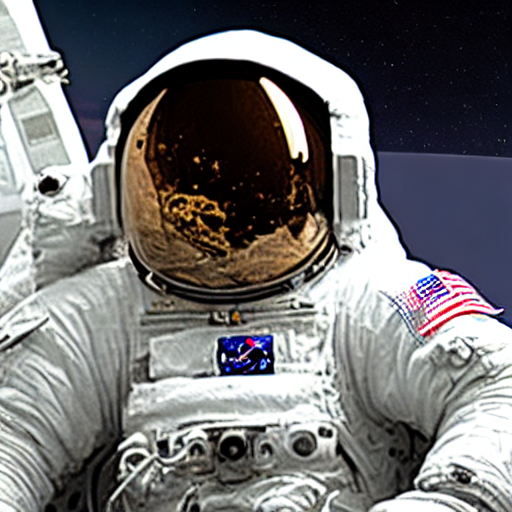

In [9]:
img

#### Generate Images - Seeds

  0%|          | 0/50 [00:00<?, ?it/s]

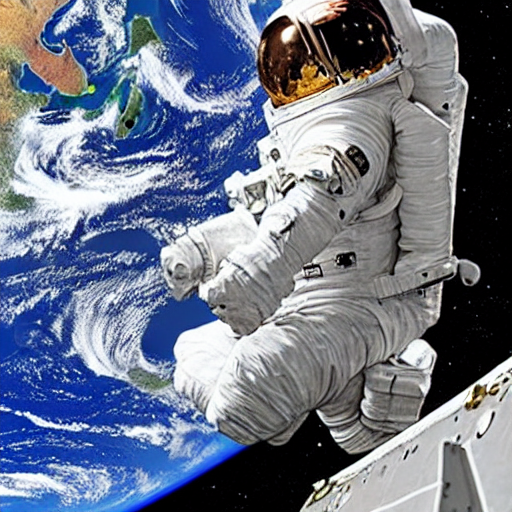

In [10]:
seed = 555 #have same number of seed for same images again and again
generator = torch.Generator("cuda").manual_seed(seed)
img = pipeLine(prompt,generator=generator).images[0]
img

#### Generate Images - Inferance Steps


*   Adds noise to images each step



  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

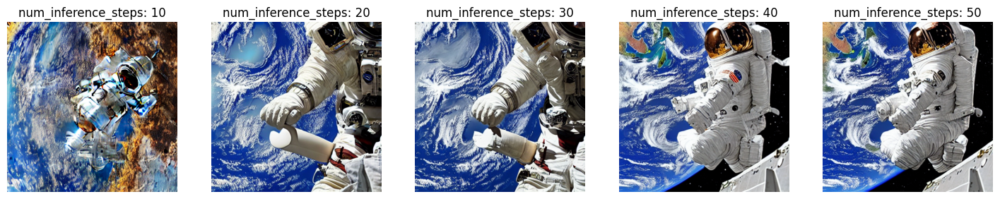

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18,8))
for i in range(1,6):
  n_steps = i*10
  generator = torch.Generator("cuda").manual_seed(seed)
  img = pipeLine(prompt,generator=generator,num_inference_steps=n_steps).images[0]
  plt.subplot(1,5,i)
  plt.title(f'num_inference_steps: {n_steps}')
  plt.imshow(img)
  plt.axis('off')

plt.show()


#### Generate Images - CFG
*   CFG (Classifier Free Guidance) also known as guidance scale.
*   In general, the values can range from **5** to **9**. Value between 7 and 8.5 are generally good choices.
*   **Less realistic images** will be returned if the value is too low or high


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

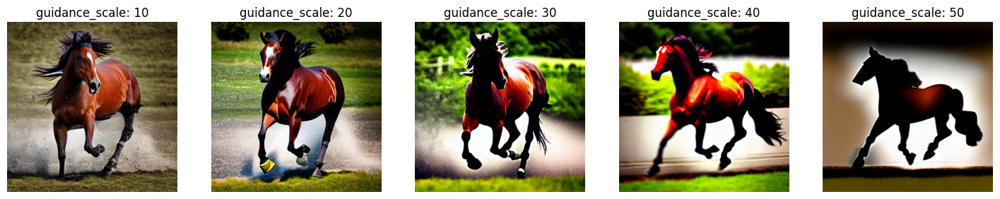

In [12]:
prompt = "photograph of a running horse"

plt.figure(figsize=(18,8))
for i in range(1,6):
  n_guidance = i*10
  generator = torch.Generator("cuda").manual_seed(seed)
  img = pipeLine(prompt,generator=generator,guidance_scale=n_guidance).images[0]
  plt.subplot(1,5,i)
  plt.title(f'guidance_scale: {n_guidance}')
  plt.imshow(img)
  plt.axis('off')

plt.show()


#### Generate Images - Dimensions


*   make sure height and width are multiples of 8
*   less than 512 (width and height) will result in lower quality images
*   more tha 512 (width and height) will repeat areas of the images (global_coherence is lost)



> Landscape mode






  0%|          | 0/50 [00:00<?, ?it/s]

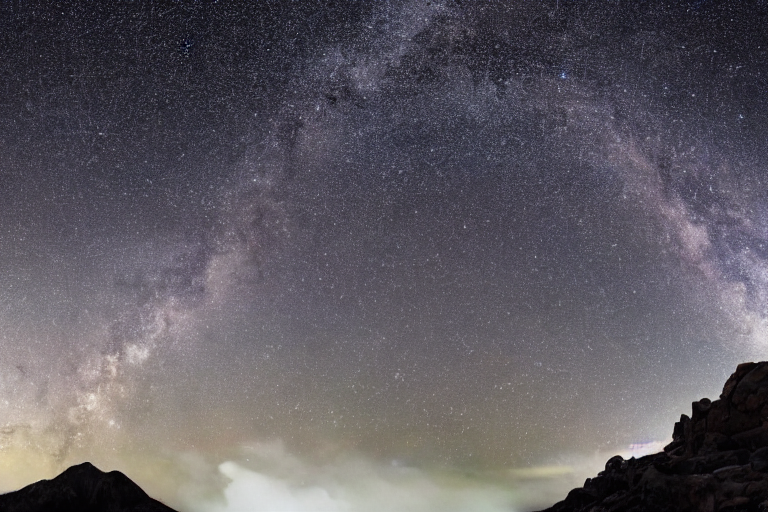

In [13]:
seed = 555
h, w = 512, 768
prompt = "photograph of a mountain landscape with milkyway galaxy on the sky"
generator = torch.Generator("cuda").manual_seed(seed)
img = pipeLine(prompt,generator=generator,height=h,width=w).images[0]
img

> Portrait Mode

  0%|          | 0/50 [00:00<?, ?it/s]

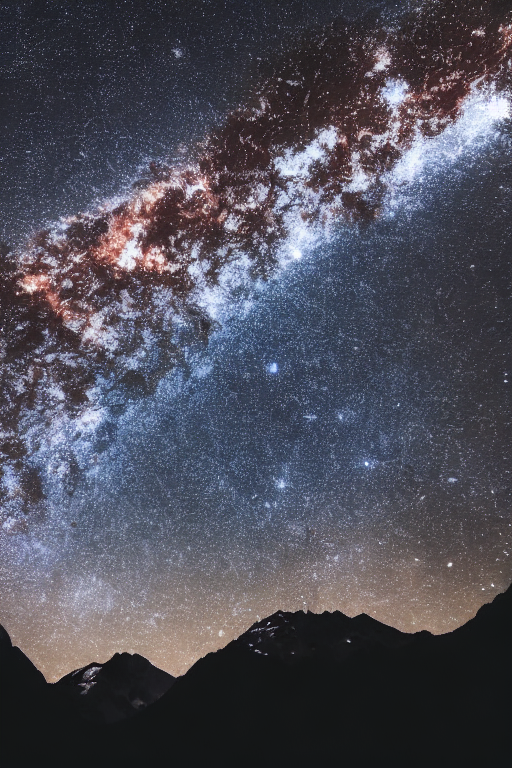

In [14]:
h, w = 768, 512
img = pipeLine(prompt,generator=generator,height=h,width=w).images[0]
img

#### Negative Prompts
*  The negative prompt is an additional way of telling what you don't want in an image [means, what you would avoid]
*  It could be used to remove objects frm the images or fix defects

  0%|          | 0/50 [00:00<?, ?it/s]

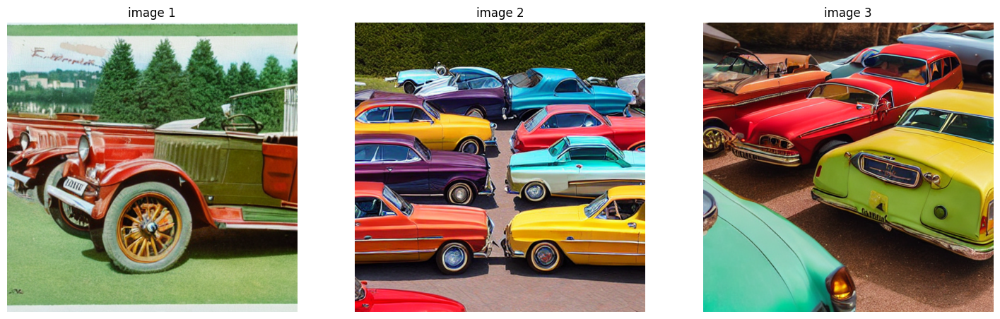

In [15]:
num_images = 3
prompt = "photograph of old cars" #prompt gives old cars with black and white images
negative_prompt = "black and white photo"

img = pipeLine(prompt,generator=generator,num_images_per_prompt=num_images,negative_prompt=negative_prompt).images
plt.figure(figsize=(18,8))
for i in range(num_images):
  plt.subplot(1,num_images,i+1)
  plt.imshow(img[i])
  plt.axis('off')
  plt.title(f'image {i+1}')
plt.show()


#### Other Models

##### SD v1.5

In [16]:
sd15 = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5",torch_dtype=torch.float16)
sd15 = sd15.to("cuda")
sd15.enable_attention_slicing()
sd15.enable_xformers_memory_efficient_attention()

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

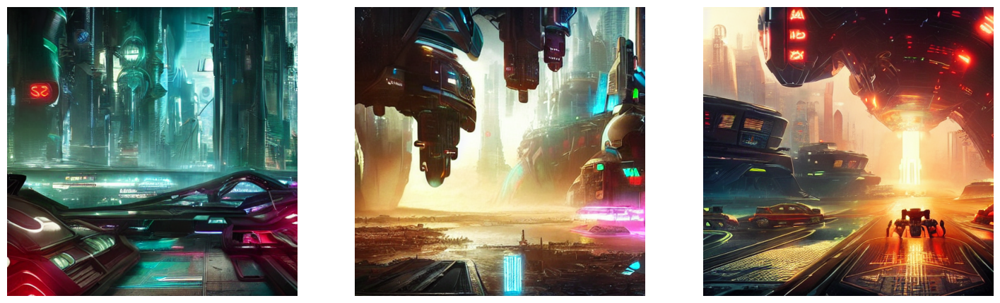

In [17]:
num_imgs = 3
prompt = 'photograph of a futuristic city in the style of cyberpunk'
neg_prompt = 'buildings'
img = sd15(prompt,generator=generator,num_images_per_prompt=num_imgs,negative_prompt=neg_prompt).images
plt.figure(figsize=(18,8))
for i in range(num_imgs):
  plt.subplot(1,num_imgs,i+1)
  plt.imshow(img[i])
  plt.axis('off')
plt.show()

##### SD v2.x

In [18]:
sd2 = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1",torch_dtype=torch.float16)
sd2 = sd2.to("cuda")
sd2.enable_attention_slicing()
sd2.enable_xformers_memory_efficient_attention()

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

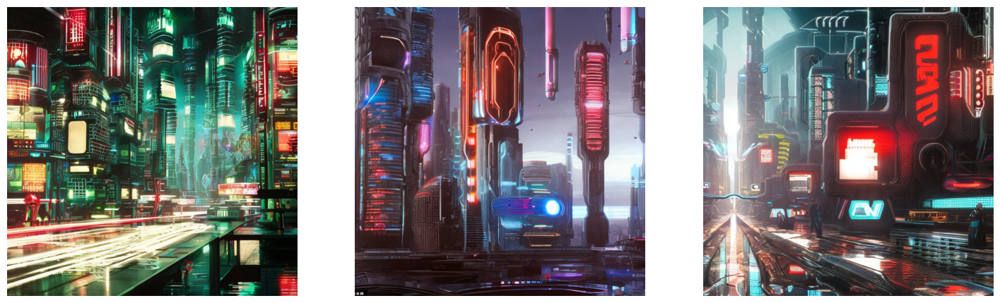

In [19]:
img = sd2(prompt,generator=generator,num_images_per_prompt=num_imgs,negative_prompt=neg_prompt).images
plt.figure(figsize=(18,8))
for i in range(num_imgs):
  plt.subplot(1,num_imgs,i+1)
  plt.imshow(img[i])
  plt.axis('off')
plt.show()

#### Models fine tuned for specific different styles
> model refs - https://huggingface.co/nitrosocke

*   Modern Disney Style - https://huggingface.co/nitrosocke/mo-di-diffusion
*   Classic Disney Style - https://huggingface.co/nitrosocke/classic-anim-diffusion
*   High Res 3D - https://huggingface.co/nitrosocke/redshift-diffusion
*   Other Anime style
  * Ghibli - https://huggingface.co/nitrosocke/Ghibli-Diffusion
  * Spiderverse - https://huggingface.co/nitrosocke/spider-verse-diffusion



